Index. To update index run this [cell](#id_table_content_update_code).
<br><br>
<div id="table-of-content"></div>

# Imports

In [7]:
import numpy as np
import pandas as pd

import copy
import glob
import warnings

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 20)


# ------------
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns

# ------------
from IPython.display import display, HTML, display_html
from functions.display_htmlFcn import display_htmlFcn

from functions.hideVals import hideVals
from functions.format_float import format_float
from functions.generate_random_color import generate_random_color
from functions.get_df_info import get_df_info

# ------------
import os
from functions.dump_or_load import dump_or_load
pickle_folder = "./databases/pickle/"

import sklearn
from sklearn import cluster        # Algoritmos de clustering.

from functions.get_bike_stations_API import get_bike_stations_API

# Stations

https://www.kaggle.com/datasets/rosenthal/citi-bike-stations?resource=download

<blockquote>
results, from 8/15/2016 - 12/8/2021
    
station information is missing for all data earlier than 8/2019
</blockquote>

In [8]:
%%time
if 0: # 7 segs
    pd.read_csv('./databases/citibike_stations/citi_bike_data_00049.csv').sample(3)

CPU times: user 4 µs, sys: 0 ns, total: 4 µs
Wall time: 5.96 µs


Casi 1 minuto solo para 1º y última fila de cada CSV! es muchísimo! Ni de coña mergees directamente todos los dfs, primero filtra cada uno.

In [9]:
import tempfile

def get_head_tail_lines_of_every_bike_stations_API_file(file_paths):
    dfs = []
    for filename in file_paths:
        # print(filename)
        with open(filename, 'r') as file:
            lines = file.readlines()

            header = lines[0].strip()
            first_row = lines[1].strip()
            last_row = lines[-1].strip()

            file_contents =  "\n".join([header, first_row, last_row])

            # Create a temporary file and write the string contents to it
            with tempfile.NamedTemporaryFile(mode='w', delete=False) as temp_file:
                temp_file.write(file_contents)
                temp_file_path = temp_file.name

            # Read the temporary file using pd.read_csv()
            df = pd.read_csv(temp_file_path)

            # get datetime and set a 2nd column
            col_name = 'station_status_last_reported'
            if pd.api.types.is_numeric_dtype(df[col_name]):
                  timestamps = pd.to_datetime(df[col_name], unit='s') \
                    .dt.tz_localize('UTC').dt.tz_convert('America/New_York')
            else:
                  timestamps = ["\\N", "\\N"]


            df['file'] = filename[-10:-4]
            df['start'] = timestamps[0]        
            df['end'] = timestamps[1]
            dfs.append(df.loc[[0], ['file', 'start', 'end']])

    # Concatenate all DataFrames into a single DataFrame
    df = pd.concat(dfs, ignore_index=True)
    return df

In [10]:
%%time

file_paths = glob.glob("./databases/citibike_stations/*.csv") # too long
file_paths = glob.glob("./databases/citibike_stations/*0004*.csv")

if 0:
    df = get_head_tail_lines_of_every_bike_stations_API_file(file_paths)

    # Display the DataFrame
    pd.set_option('display.max_rows', None)
    display(df.sort_values(by='file').reset_index(drop=True))

"""
file 	start 	end
0 	_00004 	2017-12-11 21:34:57-05:00 	2017-12-17 16:13:36-05:00
1 	_00040 	2020-06-13 14:57:56-04:00 	2021-08-06 01:04:49-04:00
2 	_00041 	2019-02-11 05:01:19-05:00 	2018-09-13 11:53:18-04:00
3 	_00042 	2021-10-21 20:06:10-04:00 	2019-04-24 08:39:36-04:00
4 	_00043 	2018-10-08 07:52:00-04:00 	2019-06-29 04:43:19-04:00
5 	_00044 	2021-10-23 00:29:00-04:00 	2021-04-18 11:30:42-04:00
6 	_00045 	2018-03-03 10:14:51-05:00 	2017-05-24 12:58:24-04:00
7 	_00046 	2017-04-26 00:13:12-04:00 	2018-04-20 23:37:28-04:00
8 	_00047 	2020-12-14 08:57:07-05:00 	2021-08-24 19:09:49-04:00
9 	_00048 	2020-11-06 14:46:53-05:00 	2018-05-06 05:39:07-04:00
10 	_00049 	2020-01-16 08:55:53-05:00 	2019-10-17 14:48:52-04:00

CPU times: user 4.66 s, sys: 8.14 s, total: 12.8 s
Wall time: 13 s
"""
pass;

CPU times: user 0 ns, sys: 651 µs, total: 651 µs
Wall time: 1.51 ms


In [11]:
pd.set_option('display.max_rows', 10)

filtra cada uno para una sola fecha

In [12]:
def get_or_dump_bike_stations_API(
    filename,
    arbitrary_date,
    file_paths,
    force = False,
):
    # results, from 8/15/2016 - 12/8/2021; station information is missing for all data earlier than 8/2019

    if force or not os.path.isfile(filename): # dump to file    
        df = get_bike_stations_API(arbitrary_date, file_paths)
        dump_or_load(filename, var=df_weather_filled_closest_stations, dump=True)
    else: # get from file
        df = dump_or_load(filename, dump=False)
        
    return df

In [13]:
%%time
"""
to create pickle file:
CPU times: user 5min 33s, sys: 1min 58s, total: 7min 32s
Wall time: 7min 34s
"""

filename = pickle_folder + "df_bike_stations_API.pkl"
file_paths = glob.glob("./databases/citibike_stations/*.csv")
# results, from 8/15/2016 - 12/8/2021; station information is missing for all data earlier than 8/2019
arbitrary_date = '2020-04-01'  # 1st april 2020 (wednesday) arbitrary selected

df = get_or_dump_bike_stations_API(filename, arbitrary_date, file_paths, force = False)

Opened <_io.BufferedReader name='./databases/pickle/df_bike_stations_API.pkl'>
CPU times: user 28.2 ms, sys: 29.4 ms, total: 57.6 ms
Wall time: 184 ms


In [14]:
# remove all rows where "num_bikes_available" is not an int
df = df[df['num_bikes_available'].apply(lambda x: isinstance(x, int))]

# remove all rows where "lat" or "lon" is not an float
df['lat'] = pd.to_numeric(df['lat'], errors='coerce').astype(float)
df['lon'] = pd.to_numeric(df['lon'], errors='coerce').astype(float)
df = df.dropna(subset=['lat','lon'])

# all rows where "num_ebikes_available" is not int is set to zero
df['num_ebikes_available'] = pd.to_numeric(df['num_ebikes_available'], errors='coerce').fillna(0).astype(int)

df = df.sort_values(by=["station_status_last_reported"]).reset_index();

In [15]:
df.head(3)

,index,station_id,num_bikes_available,num_ebikes_available,num_bikes_disabled,num_docks_available,num_docks_disabled,is_installed,is_renting,is_returning,station_status_last_reported,station_name,lat,lon,region_id,capacity,has_kiosk,station_information_last_updated,missing_station_information
0,9563,174,14,0,0,16,0,1,1,1,2020-04-01 00:00:11-04:00,E 25 St & 1 Ave,40.738177,-73.977387,71,30,true,1564692450,False
1,20161,3621,3,0,0,16,0,1,1,1,2020-04-01 00:00:11-04:00,27 Ave & 9 St,40.773983,-73.930913,71,19,true,1564692450,False
2,4254,394,13,0,0,21,0,1,1,1,2020-04-01 00:00:12-04:00,E 9 St & Avenue C,40.725213,-73.977688,71,34,true,1564692450,False


In [16]:
df.head(3)["station_status_last_reported"], df.tail(3)["station_status_last_reported"]

(0   2020-04-01 00:00:11-04:00
 1   2020-04-01 00:00:11-04:00
 2   2020-04-01 00:00:12-04:00
 Name: station_status_last_reported, dtype: datetime64[ns, America/New_York],
 37517   2020-04-01 23:59:10-04:00
 37518   2020-04-01 23:59:37-04:00
 37519   2020-04-01 23:59:47-04:00
 Name: station_status_last_reported, dtype: datetime64[ns, America/New_York])

In [17]:
get_df_info(df)[1]

Column,Non-Null Count,Percentage,Dtype
index,37520,100.0 %,int64
station_status_last_reported,37520,100.0 %,"datetime64[ns, America/New_York]"
station_information_last_updated,37520,100.0 %,object
has_kiosk,37520,100.0 %,object
capacity,37520,100.0 %,object
region_id,37520,100.0 %,object
lon,37520,100.0 %,float64
lat,37520,100.0 %,float64
station_name,37520,100.0 %,object
is_returning,37520,100.0 %,object


In [18]:
non_datetime_rows = df[df['station_status_last_reported'].dt.strftime('%Y-%m-%d %H:%M:%S').str.contains('NaT')]
if not non_datetime_rows.empty:
    print("Non-datetime64 values found in these rows:")
    print(non_datetime_rows)
else:
    print("All values in 'station_status_last_reported' column are datetime64")

All values in 'station_status_last_reported' column are datetime64


In [19]:
mask = np.array([str(k)[:11] for k in np.array(df['station_status_last_reported'].values)]) == arbitrary_date
if mask.any():
    display(df[mask]['station_status_last_reported'])
else:
    print(f"All values in 'station_status_last_reported' column are from {arbitrary_date}")

All values in 'station_status_last_reported' column are from 2020-04-01


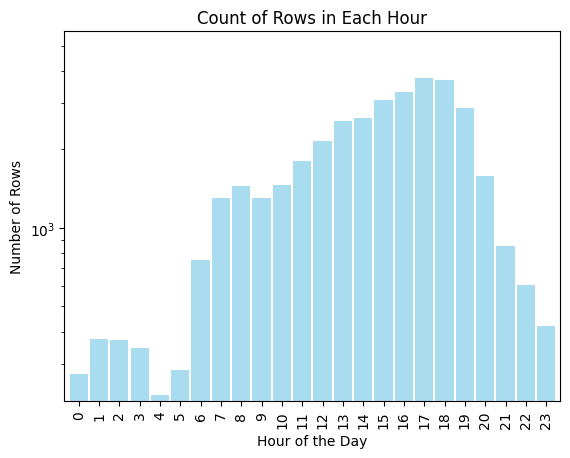

In [20]:
# Group data by hour and count the number of rows in each hour
hourly_counts = df.groupby(df['station_status_last_reported'].dt.hour).size()

# Create a bar plot to visualize the count of rows in each hour
hourly_counts.plot(kind='bar', width=0.9, color="skyblue", alpha=0.7, log=True)

# Add title and labels
plt.title('Count of Rows in Each Hour')
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Rows')
plt.ylim(bottom=hourly_counts.min()*.95);

## unique stations

In [21]:
df.head()

,index,station_id,num_bikes_available,num_ebikes_available,num_bikes_disabled,num_docks_available,num_docks_disabled,is_installed,is_renting,is_returning,station_status_last_reported,station_name,lat,lon,region_id,capacity,has_kiosk,station_information_last_updated,missing_station_information
0,9563,174,14,0,0,16,0,1,1,1,2020-04-01 00:00:11-04:00,E 25 St & 1 Ave,40.738177,-73.977387,71,30,true,1564692450,False
1,20161,3621,3,0,0,16,0,1,1,1,2020-04-01 00:00:11-04:00,27 Ave & 9 St,40.773983,-73.930913,71,19,true,1564692450,False
2,4254,394,13,0,0,21,0,1,1,1,2020-04-01 00:00:12-04:00,E 9 St & Avenue C,40.725213,-73.977688,71,34,true,1564692450,False
3,27467,3656,38,0,1,7,0,1,1,1,2020-04-01 00:00:15-04:00,E 2 St & Avenue A,40.723077,-73.985836,71,46,true,1564692450,False
4,9078,174,15,0,0,15,0,1,1,1,2020-04-01 00:00:16-04:00,E 25 St & 1 Ave,40.738177,-73.977387,71,30,true,1564692450,False


In [22]:
columns_station = ['station_name','lat','lon', 'region_id', 'has_kiosk', 'station_information_last_updated']
df_unique_stations = df.drop_duplicates(subset='station_id', keep='last', inplace=False)\
[['station_id'] + columns_station]

timestamps = (
    pd.to_datetime(df_unique_stations['station_information_last_updated'], unit="s")
    .dt.tz_localize("UTC")
    .dt.tz_convert("America/New_York")
)
df_unique_stations['station_information_last_updated'] = timestamps

df_unique_stations.head(3)

/tmp/ipykernel_19042/2954663950.py:6: FutureWarning: The behavior of 'to_datetime' with 'unit' when parsing strings is deprecated. In a future version, strings will be parsed as datetime strings, matching the behavior without a 'unit'. To retain the old behavior, explicitly cast ints or floats to numeric type before calling to_datetime.
  pd.to_datetime(df_unique_stations['station_information_last_updated'], unit="s")


,station_id,station_name,lat,lon,region_id,has_kiosk,station_information_last_updated
901,3554,Vernon Blvd & 41 Rd,40.755243,-73.948568,71,true,2019-08-01 16:48:00-04:00
1162,3277,Communipaw & Berry Lane,40.714358,-74.066611,70,true,2019-08-01 16:48:00-04:00
1178,3280,Astor Place,40.719282,-74.071262,70,true,2019-08-01 16:48:00-04:00


In [23]:
df.drop(columns=columns_station + ['index'], inplace=True)   
df.insert(1, 'station_status_last_reported', df.pop('station_status_last_reported'))
df.insert(2, 'capacity', df.pop('capacity'))
display(df.head(3))

,station_id,station_status_last_reported,capacity,num_bikes_available,num_ebikes_available,num_bikes_disabled,num_docks_available,num_docks_disabled,is_installed,is_renting,is_returning,missing_station_information
0,174,2020-04-01 00:00:11-04:00,30,14,0,0,16,0,1,1,1,False
1,3621,2020-04-01 00:00:11-04:00,19,3,0,0,16,0,1,1,1,False
2,394,2020-04-01 00:00:12-04:00,34,13,0,0,21,0,1,1,1,False


In [24]:
get_df_info(df)[1]

Column,Non-Null Count,Percentage,Dtype
station_id,37520,100.0 %,object
station_status_last_reported,37520,100.0 %,"datetime64[ns, America/New_York]"
capacity,37520,100.0 %,object
num_bikes_available,37520,100.0 %,int64
num_ebikes_available,37520,100.0 %,int64
num_bikes_disabled,37520,100.0 %,object
num_docks_available,37520,100.0 %,int64
num_docks_disabled,37520,100.0 %,object
is_installed,37520,100.0 %,object
is_renting,37520,100.0 %,object


In [25]:
get_df_info(df_unique_stations)[1]

Column,Non-Null Count,Percentage,Dtype
station_id,1489,100.0 %,object
station_name,1489,100.0 %,object
lat,1489,100.0 %,float64
lon,1489,100.0 %,float64
region_id,1489,100.0 %,object
has_kiosk,1489,100.0 %,object
station_information_last_updated,1489,100.0 %,"datetime64[ns, America/New_York]"


# map stations

In [26]:
import folium # https://bluesmonk.301621.xyz/folium-barcelona-EN.html

def mapNY_parkings(df, title=None, color='darkgreen', NY_map=None, tiles='OpenStreetMap', attr=None):       
        
    # Define a map centered around NY
    if NY_map is None:        
        NY_map = folium.Map(location=[np.median(df['lat']), np.median(df['lon'])],
                            zoom_start=12, tiles=tiles, attr=attr)
        NY_map = NY_map.add_to(folium.Figure(width=800, height=800))
    
    if title is not None:
        title_html = '''
                 <h3 align="center" style="font-size:16px"><b>{}</b></h3>
                 '''.format(title)   
        NY_map.get_root().html.add_child(folium.Element(title_html))

    for lat, lon, station_id, station_name, update_time in zip(
        df.lat, df.lon,
        df.station_id,
        df.station_name,
        df.station_information_last_updated
    ):
        
        # https://stackoverflow.com/questions/62228489/
        html=f"""<div style="text-align: center;">\
        <span style="font-size:18px; color: olive; font-weight: bold; text-align: center;">{station_name}</span></div>
        <span style="font-size:14px;">· ID: {station_id}</span>
        <span style="font-size:14px;">· lat-lon: {round(lat, 4), round(lon, 4)}</span>
        <span style="font-size:14px;">· Actualización: {str(update_time)[:-9]}</span>"""
        html = html.replace("\n","<br>")
        iframe = folium.IFrame(html, width=280, height=115)
        popup = folium.Popup(iframe, max_width=700)

        folium.features.CircleMarker(
            [lat, lon],
            radius=.5,
            color=color,
            fill=True,
            popup=popup,
            fill_opacity=0.6
        ).add_to(NY_map)
    
    return NY_map

In [27]:
mapNY_parkings(df_unique_stations)

Ni idea de  porque los custome maps como el siguiente no funcionan
https://leaflet-extras.github.io/leaflet-providers/preview/#filter=CartoDB.Voyager

In [28]:
if 0:
    m = folium.Map(location=[40.7128, -74.0060], 
           attr=None,
           tiles='OpenStreetMap', 
          )
else:
    m = folium.Map(location=[40.7128, -74.0060], 
           attr='https://{s}.basemaps.cartocdn.com/rastertiles/voyager_nolabels/{z}/{x}/{y}{r}.png',
           tiles='CartoDB.Voyager', 
          )
display(m)

In [29]:
# https://leaflet-extras.github.io/leaflet-providers/preview/
tiles_dict = {
    'Esri.WorldImagery': 'https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}',
    'CartoDB.Voyager': 'https://{s}.basemaps.cartocdn.com/rastertiles/voyager_nolabels/{z}/{x}/{y}{r}.png',
    'CartoDB.Positron': 'https://{s}.basemaps.cartocdn.com/light_all/{z}/{x}/{y}{r}.png',
    'Stadia.StamenWatercolor': 'https://tiles.stadiamaps.com/tiles/stamen_watercolor/{z}/{x}/{y}.jpg',
}
for key, val in tiles_dict.items():
    if 0:
        display(mapNY_parkings(df_unique_stations, tiles=key, attr=val))

# clustering

Motivación de emplear clustering: si agrupamos las estaciones por boro, entonces son muy pocas, si lo hacemos por NTAs son muchas (51 creo). Así que hago clustering buscando una división a priori entre 5 y 20 grupos.

- clustering en vez de en barrios en otras zonas como en:
file:///home/xopi/MEGAsync/IT_xopi_UOC_MasterDataScience/01_Modelos_avanzados_mineria_datos/PEC2/202302/JuanGabrielMarineroTarazona-PEC2.html#2-c.-Clustering



## cluster.KMeans

In [30]:
from typing import List


def plot_kmeans_elbow(X, min_k = 1, max_k = 7, algorithm="lloyd", tol=1e-4):
    fig, ax = plt.subplots(1, 1, figsize=(10, 3))
    x = range(min_k, max_k + 1)
    y = []
    for nc in x:
        kmeans = cluster.KMeans(n_clusters=nc, algorithm=algorithm, tol=tol)
        dists = kmeans.fit_transform(X)
        y.append(np.sum(np.min(dists, axis=1) ** 2))
    ax.plot(x, y)
    ax.set_xlabel('k')
    ax.set_ylabel(f'SSE\nalgorithm {algorithm}')
    ax.set_xticks(range(min_k, max_k + 1))
    ax.grid()

In [31]:
def plot_cluster_KMeans(X,y,k,algorithm="lloyd", 
                        title="y_blobs", cmap="viridis", centroids_bool=True, kmeans_bool=True,
                        model=None, y_new=None, cluster_centers=None):
    if kmeans_bool:
        model = cluster.KMeans(n_clusters=k,algorithm=algorithm)
        y_new = model.fit_transform(X)
        cluster_centers = [model.cluster_centers_[:,i] for i in range(2)]
        c=np.argmin(y_new, axis=1)
    else:
        c = y_new

    fig, axs = plt.subplots(1, 2, figsize=(6, 3))
    axs[0].scatter(X[:,0], X[:,1], s=10, c=c, alpha=.2, cmap=cmap)
    if y is not None:
        axs[1].scatter(X[:,0], X[:,1], s=10, c=y, alpha=.2, cmap=cmap)
        axs[1].set_title(f"color={title}")
        

    for i, ax in enumerate(axs):
        if i == 0 or (centroids_bool and (y is not None)):
            ax.scatter(cluster_centers[0], cluster_centers[1],
                   s=100, c='r', marker='X', linewidths=2, edgecolors='w')
        ax.axis('off');
    axs[0].set_title("kmeans\ncolor=kmeans.fit_transform(X)");

In [33]:
from sklearn.metrics import silhouette_score
from yellowbrick.cluster import KElbowVisualizer

def plot_elbow_rule_KElbowVisualizer(X, min_k = 1, max_k = 7, metric="distortion"):
    fig, axs = plt.subplots(1, 1, figsize=(10, 2))
    model = cluster.KMeans()
    visualizer = KElbowVisualizer(model, k=(min_k, max_k), timings=False, metric=metric)
    visualizer.fit(X)
    visualizer.show()

def plot_elbow_rule_all(X, min_k = 1, max_k = 10):
    plot_kmeans_elbow(X, max_k=max_k)
    plot_kmeans_elbow(X, min_k=2, max_k=10, algorithm="elkan")
    plot_elbow_rule_KElbowVisualizer(X)
    plot_elbow_rule_KElbowVisualizer(X,min_k=2,metric="silhouette")
    plot_elbow_rule_KElbowVisualizer(X,min_k=2,metric="calinski_harabasz")

In [34]:
X = df_unique_stations[['lon','lat']].values
X

array([[-73.9485678 ,  40.7552433 ],
       [-74.06661093,  40.71435837],
       [-74.07126188,  40.7192822 ],
       ...,
       [-73.97809472,  40.736502  ],
       [-73.95850939,  40.71745169],
       [-73.99379025,  40.72743423]])

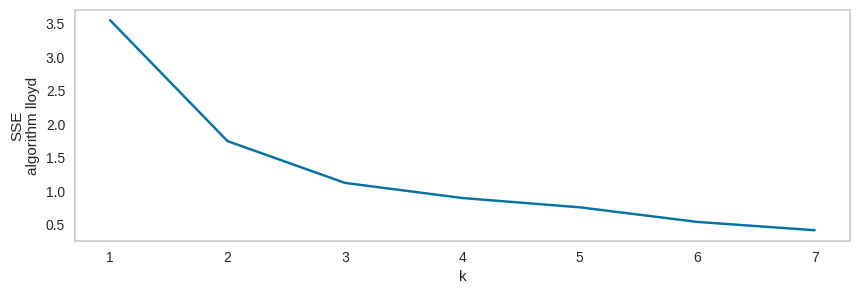

In [35]:
dists = plot_kmeans_elbow(X)

/home/xopi/Downloads/TFM_venv/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1415: RuntimeWarning: algorithm='elkan' doesn't make sense for a single cluster. Using 'lloyd' instead.
  warnings.warn(


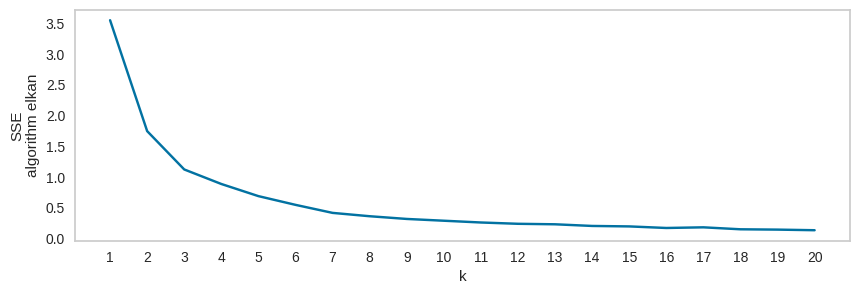

In [36]:
dists = plot_kmeans_elbow(X, 1, 20, "elkan")

/home/xopi/Downloads/TFM_venv/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1415: RuntimeWarning: algorithm='elkan' doesn't make sense for a single cluster. Using 'lloyd' instead.
  warnings.warn(


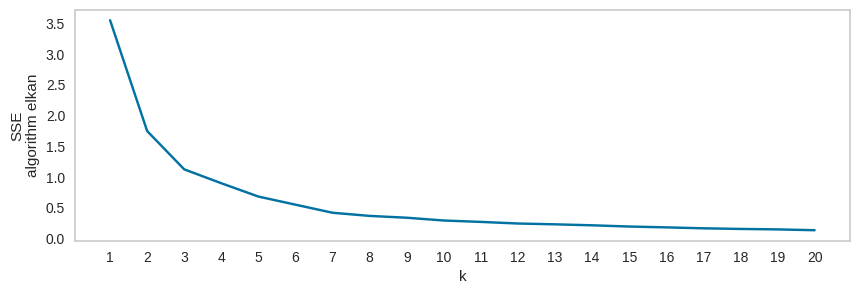

In [37]:
dists = plot_kmeans_elbow(X, 1, 20, "elkan")

/home/xopi/Downloads/TFM_venv/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1415: RuntimeWarning: algorithm='elkan' doesn't make sense for a single cluster. Using 'lloyd' instead.
  warnings.warn(


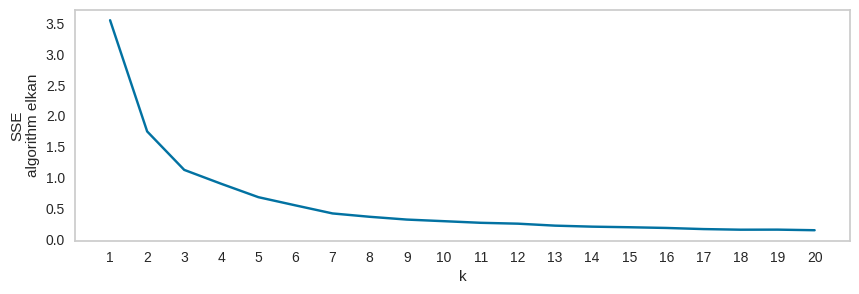

In [38]:
dists = plot_kmeans_elbow(X, 1, 20, "elkan", tol=1e-7)

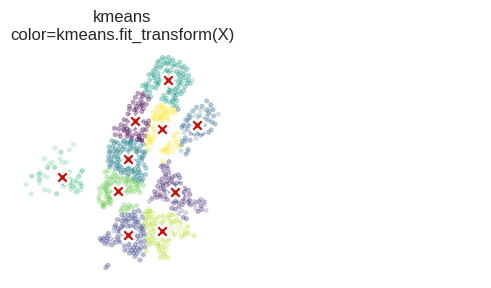

In [39]:
plot_cluster_KMeans(X, None, 10)

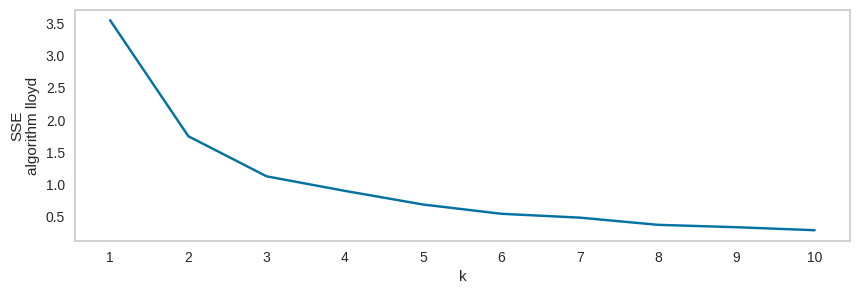

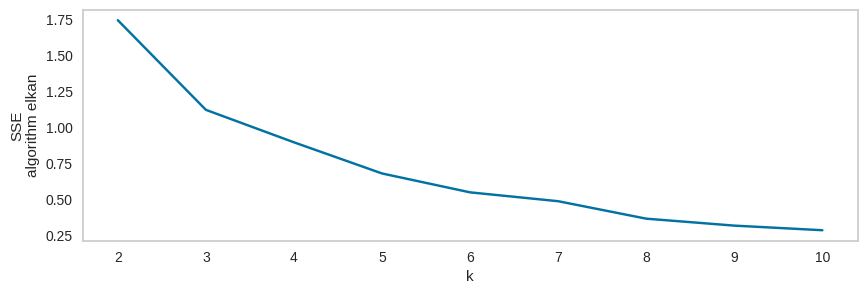

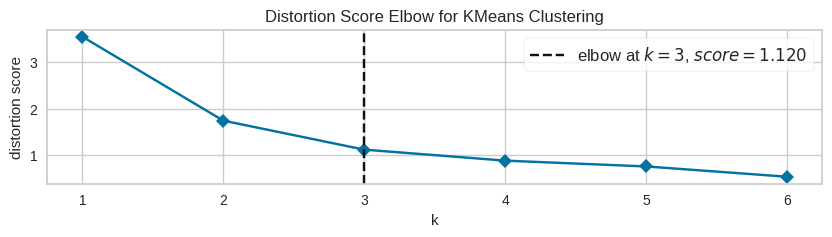

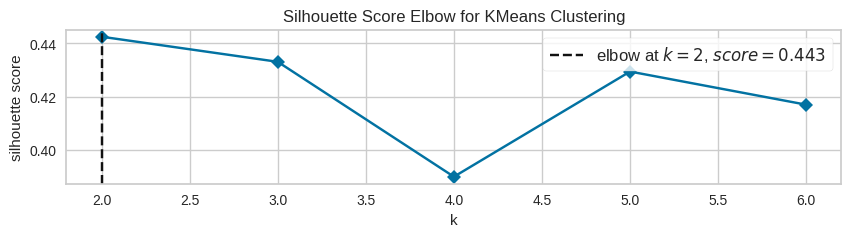

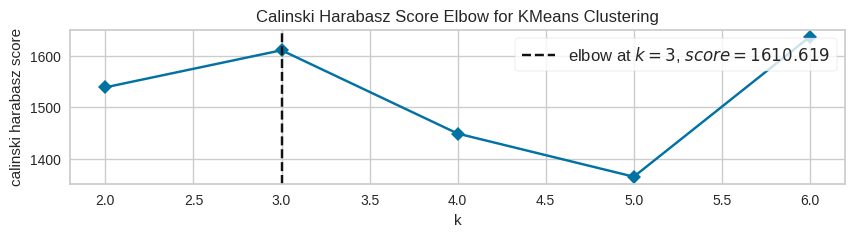

In [40]:
plot_elbow_rule_all(X)

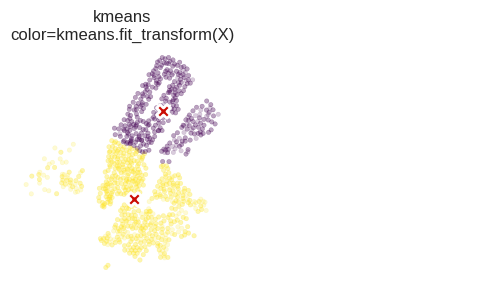

In [41]:
plot_cluster_KMeans(X,None,2,algorithm="lloyd", centroids_bool=False)

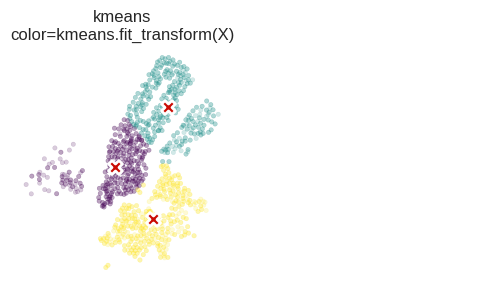

In [42]:
plot_cluster_KMeans(X,None,3,algorithm="lloyd", centroids_bool=False)

## DBSCAN

Definición de método de clustering DBSCAN pon siguiente referencia: https://www.sciencedirect.com/science/article/pii/S0378437121009559?via%3Dihub#appendix (el apéndice que indico)

When data points are very close together with small distances, DBSCAN can still perform well. It is capable of identifying clusters based on the density of points rather than just the distances between them. This means that even in scenarios where data points are very close, DBSCAN can effectively group them based on their density, making it a suitable choice for clustering tasks with closely packed data points

In [43]:
from sklearn.metrics.pairwise import haversine_distances
from math import radians

def getDist(x):
    dist_matrix = haversine_distances(x, x) # pairwise distances in radians

    upper_triangle = np.triu(dist_matrix, k=1)
    distances = upper_triangle[np.nonzero(upper_triangle)] # Flatten the upper triangle into a 1D array
    distances *= (180 / np.pi) # radians to degrees
    return distances, dist_matrix

In [44]:
def plot_distances(X, proportion = 15):
    distances, dist_matrix = getDist(X)

    percentile = np.percentile(distances, proportion)
    title = f"Percentile {proportion}%: {percentile:.2e} degrees"
    distances_percentile = distances[distances < percentile]

    for i,d in enumerate([distances, distances_percentile]):
        if i>0:
            title = f"distances < percentile {proportion}"
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

        ax1.hist(d, bins=30)
        ax1.set_xlabel('Distance (in degrees)')
        ax1.set_ylabel('Frequency')
        ax1.set_title(title)

        ax2.boxplot(d)
        ax2.set_ylabel('Distance (in degrees)')
        ax2.set_title(title)

        plt.tight_layout();
    return distances, dist_matrix

In [45]:
def iterateEps(X,eps, min_samples=2, plotBool=True, ax=None, figsize=(4, 4), show_min_samples=True):
    
    model = cluster.DBSCAN(eps=eps, min_samples=min_samples, n_jobs=-1)
    clusters = model.fit(X)
    no_label_proportion = np.mean(clusters.labels_<0)*100
    
    title = ''
    if show_min_samples:
        title = f'\nmin_samples: {min_samples:.0f}'
    
    if plotBool:
        if not ax:
            fig, ax = plt.subplots(1, 1, figsize=figsize)
        ax.scatter(X[:,1], X[:,0], s=5, c=clusters.labels_, alpha=.3, cmap='tab20')
        ax.set_title(f'eps: {eps:.2f}' + title
                     +f'\n{no_label_proportion:.1f} % in label -1'
                     +f'\n{clusters.labels_.max()+1} clusters')
        ax.axis('equal')
        
    return model.fit_predict(X), eps, min_samples

def iterateEpsPlot(X, distances, percentiles, min_samples=100, epsArr=None): 
    if epsArr is None:
        epsArr = [np.percentile(distances, k) for k in np.array(percentiles)/100]
    fig, axs = plt.subplots(ncols=len(epsArr), nrows=1, figsize=(20, 2))
    axs = axs.flatten()
    for i,eps in enumerate(epsArr):
        iterateEps(X,eps,min_samples, ax=axs[i], show_min_samples=False)
        axs[i].axis('off');
    plt.suptitle(f'min_samples: {min_samples:.0f}', y=1.35, fontsize=18)
    return epsArr

In [46]:
X = df_unique_stations[['lat','lon']].values

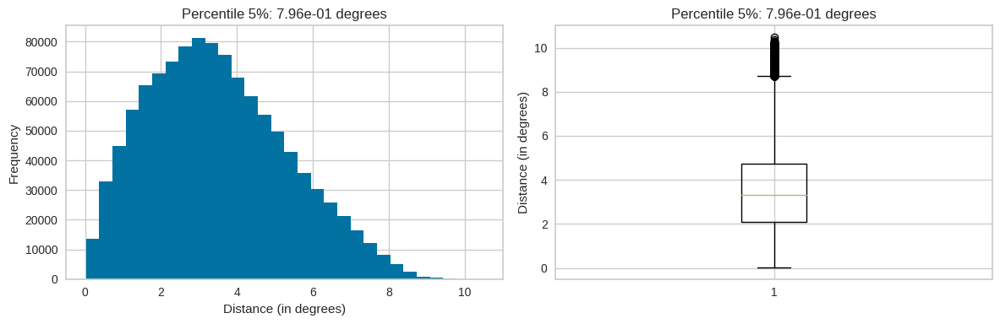

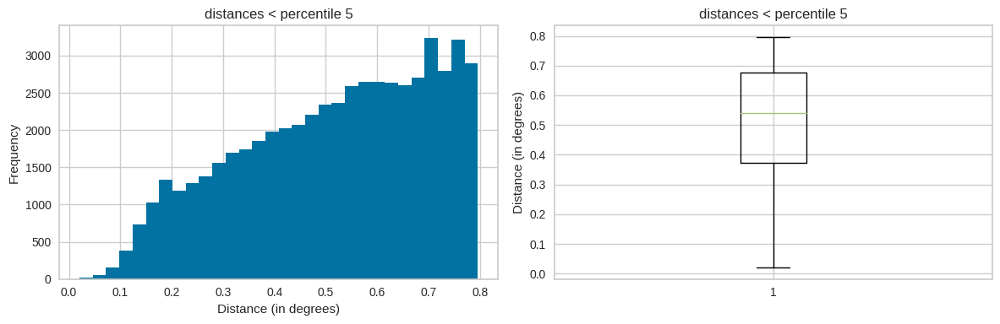

In [47]:
distances, dist_matrix = plot_distances(X, proportion=5)

In [48]:
np.percentile(distances, 1e-5) - np.percentile(distances, 1e-6)

0.0

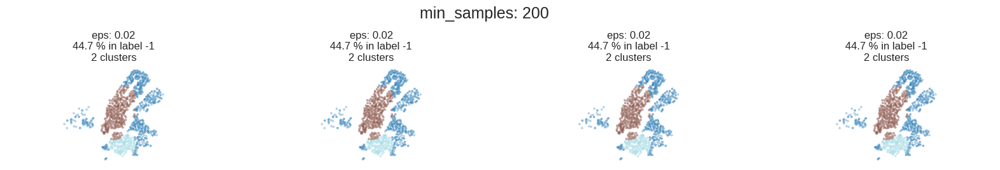

In [49]:
min_samples = 200 # arbitrario
epsArr = [iterateEpsPlot(X, distances, percentiles=k, min_samples=min_samples)
 for k in [np.arange(0.001, .005, .001)]];

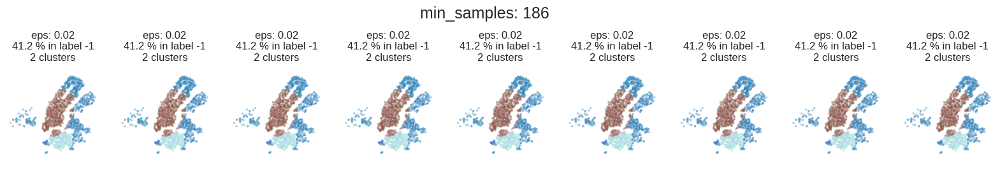

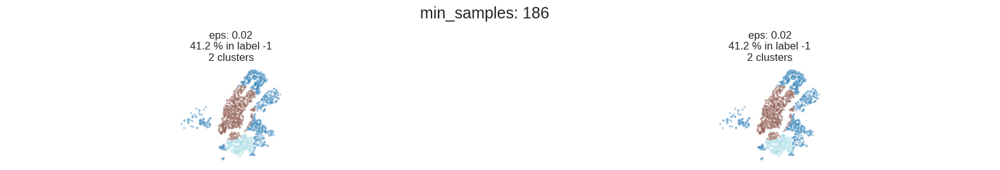

In [50]:
min_samples = int(len(X)/8) # arbitrario
v = 1e-8
epsArr = [iterateEpsPlot(X, distances, percentiles=k, min_samples=min_samples)
 for k in [np.arange(v, v*10, v), np.arange(0.001, .003, .001)]];

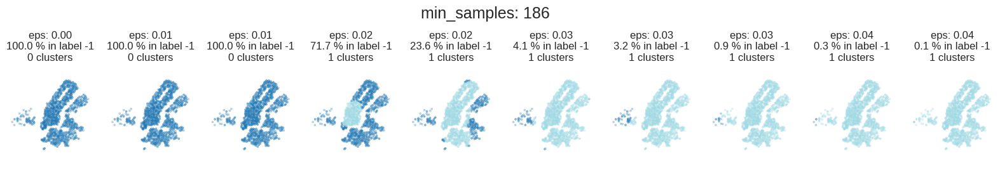

In [51]:
min_samples = int(len(X)/8) # arbitrario
p = np.percentile(distances, 1e-3)
v = p/10
epsArr = iterateEpsPlot(X, distances, _, min_samples=min_samples, epsArr = np.arange(v, p, v));

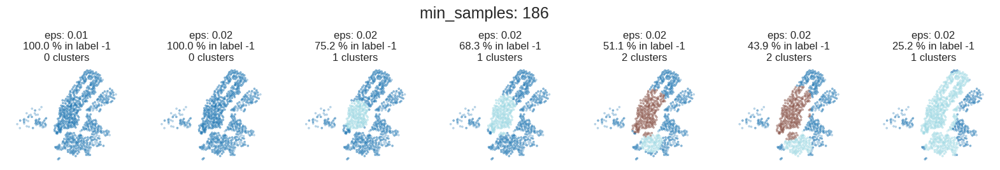

In [52]:
min_samples = int(len(X)/8) # arbitrario
p = np.percentile(distances, 1.5e-3)
v = p/40
epsArr = iterateEpsPlot(X, distances, _, min_samples=min_samples, epsArr = np.arange(p/3, p/2, v));

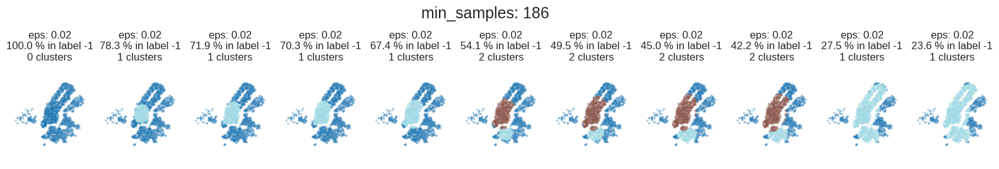

In [53]:
min_samples = int(len(X)/8) # arbitrario
p = np.percentile(distances, 1.5e-3)
epsArr = iterateEpsPlot(X, distances, _, min_samples=min_samples, epsArr = np.arange(p/2.75, p/2, p/80));

Con DSCAN no consigo crear clusterings aceptables.

Este paper usa Montecarlo (RL) para:
"The result of stations clustering, where the circles with different colours denote stations in different groups. "
https://link.springer.com/article/10.1007/s10489-021-02586-x

Pon en TFM que empleamos cluster.KMeans ya que técnicas paramétricas como DBSCAN no funciona (pregunta a profe porque no funciona) y que clusterings de este paper usando RL (muy complejo) sí consigue agruparlos.

# Storyline

In [54]:
df.head(3)

,station_id,station_status_last_reported,capacity,num_bikes_available,num_ebikes_available,num_bikes_disabled,num_docks_available,num_docks_disabled,is_installed,is_renting,is_returning,missing_station_information
0,174,2020-04-01 00:00:11-04:00,30,14,0,0,16,0,1,1,1,False
1,3621,2020-04-01 00:00:11-04:00,19,3,0,0,16,0,1,1,1,False
2,394,2020-04-01 00:00:12-04:00,34,13,0,0,21,0,1,1,1,False


In [55]:
X = df_unique_stations[['lon','lat']].values
X

array([[-73.9485678 ,  40.7552433 ],
       [-74.06661093,  40.71435837],
       [-74.07126188,  40.7192822 ],
       ...,
       [-73.97809472,  40.736502  ],
       [-73.95850939,  40.71745169],
       [-73.99379025,  40.72743423]])

In [56]:
n_clusters = 12

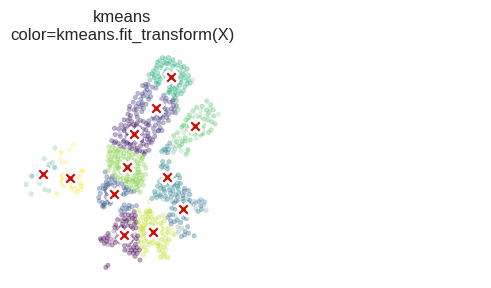

In [57]:
plot_cluster_KMeans(X,None,n_clusters,centroids_bool=False);

In [58]:
def fcn_kmeans(X, n_clusters):
    kmeans = cluster.KMeans(n_clusters=n_clusters)
    kmeans.fit(X)
    y_kmeans = kmeans.predict(X)

    centers = kmeans.cluster_centers_

    return y_kmeans, centers

In [59]:
y_kmeans, centroids = fcn_kmeans(X, n_clusters)

In [60]:
len(X), len(y_kmeans)

(1489, 1489)

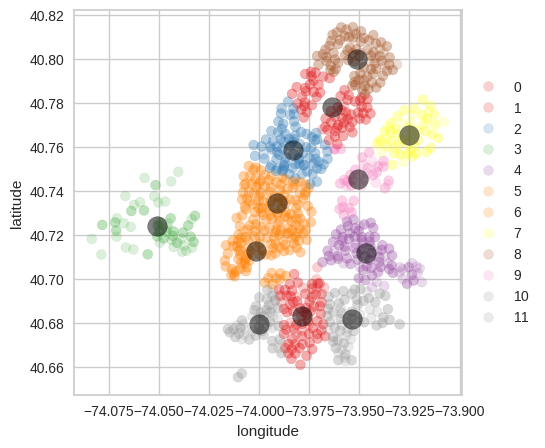

In [61]:
from matplotlib import patheffects
def plot_scatter_cluster_distance(X, y_kmeans, centroid_size=200, 
                             p=None, 
                             legend_bool=False,
                             centroid_text = None,
                             ax=None):
    if ax is None:
        fig, ax = plt.subplots(1, 1, figsize=(5, 5))

    scatter = ax.scatter(X[:, 0], X[:, 1], c=y_kmeans, s=50, cmap=plt.cm.get_cmap('Set1'), alpha=0.2)
    handles, labels = scatter.legend_elements()
    if legend_bool:
        ax.legend(handles, labels, loc='center left', bbox_to_anchor=(1, 0.5))
    ax.scatter(centroids[:, 0], centroids[:, 1], c='black', s=centroid_size, alpha=0.5)
    ax.set_xlabel("longitude")
    ax.set_ylabel("latitude")
    if p is not None:
        ax.scatter(*p.values[0][::-1], c='gold', s=200, marker='P', edgecolor='black')
    if centroid_text is not None:
        for i in range(len(centroids)):
            ax.annotate(centroid_text[i], xy=(centroids[i, 0], centroids[i, 1]), ha='center', c='white', 
                        fontsize=12, path_effects=[patheffects.withStroke(linewidth=3, foreground='black')]);
plot_scatter_cluster_distance(X, y_kmeans, legend_bool=True)

In [62]:
id_to_y_kmeans = dict(zip(df_unique_stations['station_id'], y_kmeans)) # map id to cluster_label
df_unique_stations['y_kmeans'] = df_unique_stations['station_id'].map(id_to_y_kmeans)
df_unique_stations.head(3)

,station_id,station_name,lat,lon,region_id,has_kiosk,station_information_last_updated,y_kmeans
901,3554,Vernon Blvd & 41 Rd,40.755243,-73.948568,71,true,2019-08-01 16:48:00-04:00,9
1162,3277,Communipaw & Berry Lane,40.714358,-74.066611,70,true,2019-08-01 16:48:00-04:00,3
1178,3280,Astor Place,40.719282,-74.071262,70,true,2019-08-01 16:48:00-04:00,3


In [63]:
columns_to_remove = ['capacity', 'num_ebikes_available', 'num_bikes_disabled',\
                  'num_docks_available', 'num_docks_disabled', 'is_installed', 'is_renting', 'is_returning',\
                  'missing_station_information']
df.drop(columns=columns_to_remove, inplace=True)

In [64]:
# Add a new column 'Hour' with the hour values
df['Hour'] = df['station_status_last_reported'].dt.hour

# Add a new column 'Minute' with the minute values
df['Minute'] = df['station_status_last_reported'].dt.minute

df.drop(columns=['station_status_last_reported'], inplace=True)
df.head(3)

,station_id,num_bikes_available,Hour,Minute
0,174,14,0,0
1,3621,3,0,0
2,394,13,0,0


In [65]:
df_merge = df.merge(df_unique_stations[['station_id','y_kmeans']], on=['station_id'], how='left')

col_count = 'num_bikes_available'
df_merge.head(3)

,station_id,num_bikes_available,Hour,Minute,y_kmeans
0,174,14,0,0,6
1,3621,3,0,0,7
2,394,13,0,0,6


In [66]:
grouped = df_merge.groupby(['Hour', 'Minute', 'y_kmeans'], as_index=False)[col_count].sum()
df_YMD_sum_of_bikes_per_cluster = grouped.sort_values(by=['Hour', 'Minute']) # time sorted
df_YMD_sum_of_bikes_per_cluster.head(3)

,Hour,Minute,y_kmeans,num_bikes_available
0,0,0,2,49
1,0,0,5,24
2,0,0,6,100


In [67]:
# df_storyline = df_YMD_sum_of_bikes_per_cluster.query('Hour >= 15 and Hour <= 17')

df_storyline = df_YMD_sum_of_bikes_per_cluster.drop(columns=['Minute'])\
.groupby(['Hour', 'y_kmeans']).sum('num_bikes_available').reset_index()
len(df_storyline)

286

In [68]:
df_storyline

,Hour,y_kmeans,num_bikes_available
0,0,0,47
1,0,1,410
2,0,2,706
3,0,4,509
4,0,5,512
...,...,...,...
281,23,7,424
282,23,8,614
283,23,9,59
284,23,10,195


In [69]:
title = 'Agregado horario de bicicletas mecánicas disponibles en cada agrupación' + '\n1 de abril de 2020'

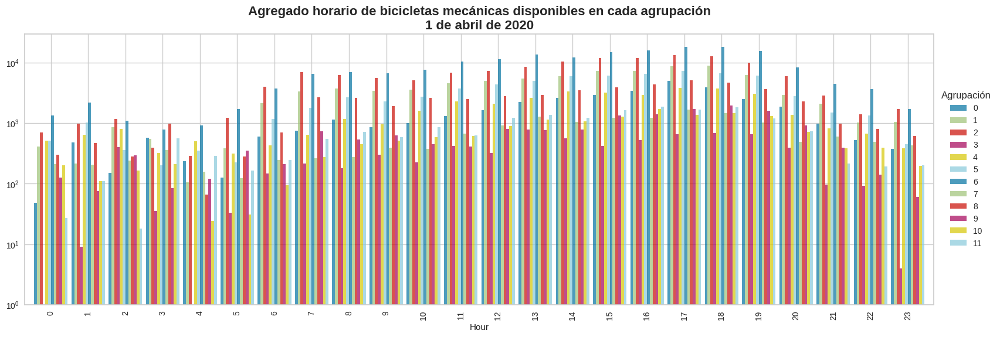

In [70]:
# Pivot the DataFrame to have "y_kmeans" values as columns
df_pivot = df_storyline.pivot(index='Hour', columns='y_kmeans', values='num_bikes_available')

# Plot the pivoted DataFrame
ax = df_pivot.plot(kind='bar', width=0.9, alpha=0.7, log=True, figsize=(20, 6))
ax.legend(title='Agrupación', loc='center left', bbox_to_anchor=(1, 0.5))
ax.set_title(title, fontsize=16, fontweight='bold');

In [71]:
df_pivot.columns

Index([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11], dtype='int32', name='y_kmeans')

In [72]:
import plotly.graph_objects as go

# Pivot the DataFrame to have "y_kmeans" values as columns
df_pivot = df_storyline.pivot(index='Hour', columns='y_kmeans', values='num_bikes_available')

# Create the interactive bar plot
fig = go.Figure()

for col in df_pivot.columns:
    fig.add_trace(go.Bar(
        x=df_pivot.index,
        y=df_pivot[col],
        name=str(col),
        text=df_pivot[col].apply(lambda x: f"{x:,.0f}"),  # Format hover text with commas
        hovertemplate=f'<b>Cluster: {col}</b><br>Hora: %{{x}}<br>Bicis: %{{text}}<extra></extra>'
    ))

fig.update_layout(
    title={
        'text': title.replace('\n','<br>'),
        'x': 0.5,  # Center the title
        'y': 0.9,  # Adjust the vertical position if needed
        'xanchor': 'center',
        'yanchor': 'top'
    },
    xaxis_title='Hora',
    yaxis_title='Bicicletas disponibles',
    bargap=0.1,
    legend_title_text='Agrupación',
    font=dict(
        family="Courier New, monospace",
        size=14,
        color="RebeccaPurple"
    )
)

fig.show()

In [73]:
def get_centroid_size(df, n_clusters=n_clusters, col_count=col_count):
    # centroid_size = df_YMDHM.sort_values(by='y_kmeans')['sum_bikes'] # not correct if any cluster missining
    centroid_size = np.zeros(n_clusters, dtype='int')
    clusters, sum_arr = df.sort_values(by='y_kmeans')[['y_kmeans',col_count]].values.T
    for i,cluster in enumerate(clusters):
        centroid_size[int(cluster)] = sum_arr[i]
    return centroid_size

In [74]:
import numpy as np
from matplotlib import pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

def plot_storyline_hour_minute(df, title = '', outfile=None, scale=1.2):
    fig, axs = plt.subplots(1, 1, figsize=(6, 6))
 
    mask = (df['y_kmeans'] == 0) # 1st label, could be any label
    hours, minutes = df[['Hour','Minute']][mask].values.T
    df_YMDHM = df.query(f'Hour == {hours[0]} and Minute == {minutes[0]}')

    # Initialize plots
    plot_scatter_cluster_distance(X, y_kmeans, centroid_size=get_centroid_size(df_YMDHM)/scale, ax=axs)
    

    # https://stackoverflow.com/questions/66938713
    suptitle = plt.suptitle("", fontsize=12, y=1.0, fontweight='bold')

    def animate(ii):
        hour = hours[ii]
        minute = minutes[ii]
        df_YMDHM = df.query(f'Hour == {hour} and Minute == {minute}')
        
        
        # plt.suptitle("Iteration: {}".format(ii + 1), fontsize=16)
        suptitle.set_text(title + f'\n{hour}:{minute:02d}')

        axs.clear()
        sum_bikes = get_centroid_size(df_YMDHM)
        plot_scatter_cluster_distance(X, y_kmeans, centroid_size=sum_bikes/scale, ax=axs,
                                      centroid_text=sum_bikes)

        return axs

    anim = FuncAnimation(
        fig,
        animate,
        frames=np.arange(sum(mask)),
        interval=50, repeat=False
    )

    plt.close()  # Close the plot to prevent double display

    if outfile:
        # anim.save requires imagemagick library to be installed
        anim.save(outfile, dpi=80, writer='imagemagick')

    return HTML(anim.to_jshtml())


# plot_storyline_hour_minute(df_storyline, title)

In [75]:
print(title)
before_newline, afternewline = title.split('\n')
half_length = 30 # len(before_newline) // 2
first_half = before_newline[:half_length]
second_half = before_newline[half_length:]
title_new = first_half + '\n' + second_half + '\n\n' + afternewline
title_new

Agregado horario de bicicletas mecánicas disponibles en cada agrupación
1 de abril de 2020


'Agregado horario de bicicletas\n mecánicas disponibles en cada agrupación\n\n1 de abril de 2020'

In [76]:
import numpy as np
from matplotlib import pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

def plot_storyline_hour(df, title = '', outfile=None, scale=1.2):
    fig, axs = plt.subplots(1, 1, figsize=(6, 6))
 
    mask = (df['y_kmeans'] == 0) # 1st label, could be any label
    hours = df['Hour'][mask].values

    # Initialize plots
    plot_scatter_cluster_distance(X, y_kmeans, centroid_size=get_centroid_size(df)/scale, ax=axs)
    

    # https://stackoverflow.com/questions/66938713
    # mpl.font_manager.get_font_names()
    suptitle = plt.suptitle("", fontsize=12, y=1.0, fontweight='bold', family="Liberation Mono")

    def animate(ii):
        hour = hours[ii]        
        df_YMDH = df.query(f'Hour == {hour}')
        
        
        # plt.suptitle("Iteration: {}".format(ii + 1), fontsize=16)
        suptitle.set_text(title + f'   Horas de {hour:2d} a {hour+1:2d}')

        axs.clear()
        sum_bikes = get_centroid_size(df_YMDH)
        plot_scatter_cluster_distance(X, y_kmeans, centroid_size=sum_bikes/scale, ax=axs,
                                      centroid_text=sum_bikes)

        return axs

    anim = FuncAnimation(
        fig,
        animate,
        frames=np.arange(sum(mask)),
        interval=50, repeat=False
    )

    plt.close()  # Close the plot to prevent double display

    if outfile:
        # anim.save requires imagemagick library to be installed
        anim.save(outfile, dpi=80, writer='imagemagick')

    return HTML(anim.to_jshtml())


plot_storyline_hour(df_storyline, title_new)

# Diagramas de Sankey

In [196]:
def get_values_for_SankeyDiagram(df_YMDHM_hist, indexes):
    key_0, df_YMDHM_hist_0 = list(df_YMDHM_hist.items())[indexes[0]]
    key_1, df_YMDHM_hist_1 = list(df_YMDHM_hist.items())[indexes[1]]
    
    sum_bikes_0 = get_centroid_size(df_YMDHM_hist_0)
    sum_bikes_1 = get_centroid_size(df_YMDHM_hist_1)

    sum_bikes_0 = sum_bikes_0/sum(sum_bikes_0) * 100
    sum_bikes_1 = sum_bikes_1/sum(sum_bikes_1) * 100
    
    values = np.zeros((12,12))
    idle = np.zeros(12)
    debt = np.zeros(12)
    for i,b1 in enumerate(sum_bikes_1): # actual   bikes in cluster i
        b0 = sum_bikes_0[i]             # previous bikes in cluster i
        if b0 > b1: # previous more bikes than actual in same cluster, then all from actual come from previous
            values[i,i] = b1
            idle[i] = b0 - b1
        else:
            values[i,i] = b0
            debt[i] = b1 - b0
    idle_proportion = idle/sum(idle)    
    debt_proportion = debt/sum(debt)  
    # print(idle, idle_proportion, debt, debt_proportion)
    
    for i,b1 in enumerate(sum_bikes_1): # actual   bikes in cluster i
        d = debt_proportion[i]
        if d == 0:
            pass # print(i,'solved')
        else:
            for j, value in enumerate(idle_proportion):
                if i!=j:
                    values[j,i] = value*d
                    
    clusters_0 = [str(k) for k in range(12)]
    clusters_1 = copy.copy(clusters_0)
    # clusters_0[0] += '\t\t' + key_0
    # clusters_1[0] = key_1 + '\t\t' + clusters_1[0]

    return values, clusters_0, clusters_1, [key_0, key_1]

def get_node_link_colors(col1, col2, cmap, opacity, n):
    source = [
            i for i in np.arange(n) for _ in range(n)
        ]  # [0, 0, 0, 1, 1, 1, 2, 2, 2] if n==3
    unique_cols = np.unique(col1 + col2)
    cmap = plt.cm.get_cmap(cmap, len(unique_cols))
    node_colors = {}
    for i, col in enumerate(unique_cols):
        rgba_color = tuple(int(x * 255) for x in cmap(i)[:3]) + (opacity,)
        node_colors[col] = f"rgba{rgba_color}"

    link_colors = [node_colors[col1[idx]] for idx in source]
    node_colors = [node_colors[k] for k in col1 + col2]

    return node_colors, link_colors


def classification_SankeyDiagram2Axis(
    data_arr,
    col1s=None,
    col2s=None,
    cmap="tab10",
    opacity=0.5,
    title_text="Confussion matrix<br> · left: true labels<br> · right: predicted labels<br>",
    title_left="Election 1",
    title_right="Election 2",
    valueformat=".0f",
    valuesuffix="",  # Watts, votes,...
    arrangement="freeform",  # https://plotly.com/python/reference/sankey/#sankey-arrangement
    debug=False,
):
    cols = []
    sources = []
    targets = []
    node_colors = []
    link_colors = []
    values = []
    if debug:
        print(data_arr)
    for i, data in enumerate(data_arr):
        col1 = col1s[i]
        col2 = col2s[i]
        
        n = len(data)
        if isinstance(data, np.ndarray):
            data = data.tolist()
        cols.append(col1 + col2)

        # Define colors for nodes and links
        source = [i for i in np.arange(i*n,(i+1)*n) for _ in range(n)]  # [0, 0, 0, 1, 1, 1, 2, 2, 2] if n==3
        target = np.concatenate( [np.arange(i*n,(i+1)*n) + n for _ in range(n)])  # [3, 4, 5, 3, 4, 5, 3, 4, 5] if n==3
        node_color, link_color = get_node_link_colors(col1, col2, cmap, opacity, n)
        value = sum(data, [])  # Flatten the list of lists
        
        sources.append(source)
        targets.append(target)
        node_colors.append(node_color)
        link_colors.append(link_color)
        values.append(value)
        if debug:
            print("source:", source)
            print("target:", target)
            print("node_color:", node_color)
            print("link_color:", link_color)
            print("value:", value)
            print(40*'- ')

    cols = np.array(cols).flatten().tolist()
    sources = np.array(sources).flatten().tolist()
    targets = np.array(targets).flatten().tolist()
    node_colors = np.array(node_colors).flatten().tolist()
    link_colors = np.array(link_colors).flatten().tolist()
    values = np.array(values).flatten().tolist()
    if debug:
        print("cols:", cols)
        print("sources:", sources)
        print("targets:", targets)
        print("node_colors:", node_colors)
        print("link_colors:", link_colors)
        print("values:", values)
    

    fig = go.Figure(
        go.Sankey(
            arrangement=arrangement,
            valueformat=valueformat,
            valuesuffix=valuesuffix,
            node=dict(
                pad=15,
                thickness=20,
                line=dict(color="black", width=0.5),
                label=cols,
                color=node_colors,
            ),
            link=dict(
                source=sources,
                target=targets,
                value=values,
                color=link_colors,
            ),
        )
    )
    fig.update_layout(title_text=title_text, font_size=10)

    return fig

In [197]:
from collections import OrderedDict
df_YMDH_hist = OrderedDict()

mask = (df_storyline['y_kmeans'] == 0) # 1st label, could be any label
hours = df_storyline['Hour'][mask].values
for h in hours:
    df_YMDH = df_storyline.query(f'Hour == {h}')[['y_kmeans',col_count]]
    if not df_YMDH.empty:
        df_YMDH_hist[f'{h:2d}'] = df_YMDH

In [198]:
values, clusters_0, clusters_1, times  = get_values_for_SankeyDiagram(df_YMDH_hist, [3,4])
classification_SankeyDiagram2Axis(
        [values],
        [clusters_0],
        [clusters_1],
        title_text="Evolución porcentual de bicis disponibles:\t" + ' - '.join(times),
        valuesuffix="% bicis",
        valueformat=".2f",
        debug=False
    )

In [199]:
print(values[0], clusters_0, clusters_1, times )
print(type(values),type(clusters_0),type(clusters_1),type(times))

[7.65691752e+00 0.00000000e+00 5.10338163e-03 0.00000000e+00
 2.92417911e-02 2.13061790e-02 4.20321517e-02 0.00000000e+00
 0.00000000e+00 6.59154212e-03 0.00000000e+00 0.00000000e+00] ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11'] ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11'] [' 3', ' 4']
<class 'numpy.ndarray'> <class 'list'> <class 'list'> <class 'list'>


In [200]:
step = 1
hours_to_plot = list(range(12,20, step))
N = len(hours_to_plot)
clusters_0 = np.empty((N,n_clusters), dtype=object).tolist() # dtype=str is just for 1 lenght strings (chars)
clusters_1 = np.empty((N,n_clusters), dtype=object).tolist()
times = [np.array([], dtype=object).tolist() for _ in range(N)]
values = [np.zeros_like(values, dtype=float) for _ in range(N)]
for i in range(N):
    values[i], clusters_0[i], clusters_1[i], time = get_values_for_SankeyDiagram(df_YMDH_hist, [i*step,(i+1)*step])
    times[i] = time[0]

In [201]:
print(values[0][0], clusters_0[0], clusters_1[0], "\n", times[0])
print(type(values),type(clusters_0[0]),type(clusters_1[0]),type(times[0]))

[1.07477704 0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.        ] ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11'] ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11'] 
  0
<class 'list'> <class 'list'> <class 'list'> <class 'str'>


In [202]:
classification_SankeyDiagram2Axis(
        values,
        clusters_0,
        clusters_1,
        title_text="Evolución porcentual de bicis disponibles:\t" + ' - '.join([str(k) for k in hours_to_plot+[hours_to_plot[-1]+1]]),
        valuesuffix="% bicis",
        valueformat=".2f",
        debug=False
    )

--------------
--------------

**Customize HTML**
<div id="id_table_content_update_code"></div>

**Icon**

In [203]:
from functions.HTML_favicon_generate_rotate import HTML_favicon_generate_rotate

HTML_favicon_generate_rotate("TFM", fontsize=18, backgroundcolor='green', textcolor='black', angle=0, 
                            font="/usr/share/fonts/truetype/ubuntu/UbuntuMono-R.ttf")

**Index update**

Run next code cell to update the [Table of contents](#table-of-content) (if any).

In [204]:
from functions.HTML_index_generate_v2 import HTML_index_generate_v2
from IPython.display import display, Javascript

display(Javascript(HTML_index_generate_v2(IndexId="#table-of-content")))

<IPython.core.display.Javascript object>